In [1]:
import pandas as pd
import numpy as np
import config
import datetime
from sqlalchemy import text
import plotly
import plotly.express as px
import ipywidgets
from urllib.request import urlopen
import json
import plotly.graph_objects as go
import geopandas as gpd
import warnings
import pyproj
import plotly.io as pio
import pickle
print(config.version)
print(config.connection_string)
print(plotly.__version__, ipywidgets.__version__, pd.__version__, np.__version__)
pd.set_option('display.max_columns', None)
warnings.filterwarnings('ignore', category=UserWarning) 
pd.options.mode.copy_on_write = True


3.2.0.Dev
postgresql://postgres:sa@localhost/icip
6.3.1 8.1.7 2.0.0 1.26.4


In [2]:
# gdf = gpd.read_file("../data/iris/contours-iris.gpkg")
# gdf = gdf.to_crs(epsg=4326)
# gdf["fid"] = gdf.index
# gdf["lon"] = gdf.geometry.centroid.x
# gdf["lat"] = gdf.geometry.centroid.y
# gdf = gdf.sort_values(by="code_iris")
# with open("../data/iris/gdf.pickle", "wb") as f:
#     pickle.dump(gdf, f)
with open("../data/iris/gdf.pickle", "rb") as f:
    gdf_france = pickle.load(f)
    geojson=gdf_france.__geo_interface__
    print(len(gdf_france))

48569


In [3]:
years = list(range(13,25))
bor_dico = {"urgence_gen": "Urgences générales", "urgence_ped": "Urgences prédiatriques", "psy": "Etablissements psychiatriques", "pharma": "Pharmacies"}

Documentation

code_commune: il y a plusieurs possibilités :
* le code de la commune sur 5 chiffres, par exemple "06088" pour Nice
* certains anciens code commune sont acceptés comme 75101 pour Paris 1er arrondissement
* le département sur 2 chiffres, par exemple "06"
* le code IRIS sur 9 chiffres, par exemple "382050000"
* une liste de code IRIS entre crochet, par exemple \["385480000", "382050000"]
* une liste de code commune entre crochet, par exemple \["38548", "38205"]
* le code IRIS avec un joker sql de type "3820%"
* pour la corse utiliser les préfixes 2A ou 2B et non 20, par exemple "2A004"

bor: voir tableau ci dessus

time: 30 ou 45, il est possible d'en faire d'autre mais il faut lancer les calculs

time_type: "HC" ou "HP"

aexp: -0.12 ou -0.1 ou -0.08 ou -0.06 ou -0.04<br>
Pour time==30 aexp: -0.12 ou -0.1 ou -0.08<br>
Pour time==45 aexp: -0.08 ou -0.06<br>
Pour time==60 aexp: -0.06 ou -0.04

norm_colorbar = True si normalisé sur France entière False sinon

meanw_colorbar = True si normalisé sur moyenne pondérée, False si normalisé sur Médiane

Pour ne plus voir les labels sur les IRIS mettre limit_show=0

Puis appuyer sur le bouton Restart (bouton avec double flèche à droite FFW) ou dans le menu Run / Run selected cell and all below

In [4]:
code_commune="06088" #"75101" #"75056" #"69123" #"38185"  #"06088" "38205" "38548" "2A004" "382050000" ["385480000", "382050000"] ["38548", "38205"] "45" "14581" bug
bor = "pharma"
time=60
time_type="HC" # HC or HP
norm_colorbar=False
meanw_colorbar=True
code_commune,bor,time,time_type,norm_colorbar,meanw_colorbar

('06088', 'pharma', 60, 'HC', False, True)

In [5]:
if type(code_commune) is list:
    if len(code_commune[0])==5:
        type_code="CLIST"
    elif  len(code_commune[0])==9:
        type_code = "ILIST"
    else:
        raise ValueError(f"Bad {code_commune}")    
elif "%" in code_commune and len(code_commune) > 2:
    type_code = "LIKE"
elif len(code_commune) == 2:
    type_code = "LIKE"
    code_commune = code_commune + "%"
elif len(code_commune) == 5:
    type_code = "COM"
elif len(code_commune) == 9:
    type_code = "IRIS"
else:
    raise ValueError(f"Bad {code_commune}")
print(f"Type code: {type_code}")

Type code: COM


In [6]:
sql = f"""
select i.*, c.nom commune_nom from iris.commune c
join iris.iris i on i.commune_id=c.id
where c.code='{code_commune}'
order by i.id
"""
commune_nom = None
if type_code=="COM":
    iris_df = pd.read_sql(sql, config.connection_string)
    iriss = iris_df["code"].values
    commune_nom = iris_df["commune_nom"].iloc[0] if len(iris_df) > 0 else None
elif type_code in ["IRIS", "LIKE"]:
    iriss = [code_commune]
elif type_code == "ILIST":
    iriss = code_commune
elif type_code == "CLIST":
    sql = f"""
select i.*, c.nom commune_nom from iris.commune c
join iris.iris i on i.commune_id=c.id
where c.code in {tuple(code_commune)}
"""
    print(sql)
    iris_df = pd.read_sql(sql, config.connection_string)
    iriss = iris_df["code"].values
    commune_nom = iris_df["commune_nom"].iloc[0] if len(iris_df) > 0 else None
print(f"Found {len(iriss)} iris for {commune_nom}")

if type_code == "LIKE":
    gdf = gdf_france[gdf_france["code_iris"].str.startswith(code_commune[:-1])]
elif len(iriss)>0:
    gdf = gdf_france[gdf_france["code_iris"].isin(iriss)]
else:
    gdf = gdf_france[gdf_france["code_insee"]==code_commune]
    type_code="INSEE"
if commune_nom is None:
    commune_nom=gdf["nom_commune"].iloc[0] if len(gdf) > 0 else None
    print(f"Found {len(gdf)} iris in {commune_nom}")
geojson=gdf.__geo_interface__
print(f"Found {len(gdf)} geo iris for {commune_nom}, type_code: {type_code}")
# gdf_france[gdf_france["nom_commune"].str.startswith("Lyon")].head(100)
gdf.head(2)

Found 146 iris for Nice
Found 146 geo iris for Nice, type_code: COM


,cleabs,code_insee,nom_commune,iris,code_iris,nom_iris,type_iris,geometry,fid,lon,lat
2597,IRIS____0000000060880101,06088,Nice,0101,060880101,Saleya-Château,H,"MULTIPOLYGON (((7.28193 43.69312, 7.28159 43.6...",2597,7.277064,43.695476
4458,IRIS____0000000060880102,06088,Nice,0102,060880102,Vieux Nice-Sainte-Réparate,H,"MULTIPOLYGON (((7.27454 43.69773, 7.27598 43.6...",4458,7.275641,43.697293


In [7]:
def get_study_by_year(year):
    sql = f"""
    select * from sae.dist_study s
    where s.bor='{bor}'
    and s.year=20{year}
    and s.time={time}
    and s.time_type='{time_type}'
    order by date desc
    limit 1
    """
    return pd.read_sql(sql, config.connection_string)

def get_studies_by_years(years: list[int]):
    df = None
    for year in years:
        if df is None:
            df = get_study_by_year(year)
        else:
            df = pd.concat([df, get_study_by_year(year)], ignore_index=True)
    return df
        
        
    
studies_df = get_studies_by_years(years)
studies_df

,year,bor,time,time_type,meanw,mean,std,q10,q25,q50,q75,q90,min,max,passu_mean,etpsal_mean,efflib_mean,etp_mean,tension_mean,date,key
0,2013,pharma,60,HC,13.701121,35.528815,41.327682,0.0,0.0,8.0,90.0,90.0,0.0,90.0,None,None,None,None,None,2025-12-17 00:47:06.488793,362023833145
1,2014,pharma,60,HC,13.729240,35.580844,41.332374,0.0,0.0,8.0,90.0,90.0,0.0,90.0,None,None,None,None,None,2025-12-17 00:47:14.437985,707793159156
2,2015,pharma,60,HC,13.752684,35.627705,41.338949,0.0,0.0,8.0,90.0,90.0,0.0,90.0,None,None,None,None,None,2025-12-17 00:47:23.078320,299922853113
3,2016,pharma,60,HC,13.825820,35.706150,41.352391,0.0,0.0,8.0,90.0,90.0,0.0,90.0,None,None,None,None,None,2025-12-17 00:47:31.296048,448769341439
4,2017,pharma,60,HC,13.879058,35.777986,41.361897,0.0,0.0,8.0,90.0,90.0,0.0,90.0,None,None,None,None,None,2025-12-17 00:47:39.930553,261179131655
5,2018,pharma,60,HC,90.050060,90.000000,0.000000,90.0,90.0,90.0,90.0,90.0,90.0,90.0,None,None,None,None,None,2025-12-17 00:47:48.576732,421668282932
6,2019,pharma,60,HC,13.872348,35.864008,41.377157,0.0,0.0,8.0,90.0,90.0,0.0,90.0,None,None,None,None,None,2025-12-17 00:47:56.647163,976132212865
7,2020,pharma,60,HC,14.029515,36.108135,41.421772,0.0,0.0,9.0,90.0,90.0,0.0,90.0,None,None,None,None,None,2025-12-17 00:48:05.739784,801647714145
8,2021,pharma,60,HC,14.125890,36.269925,41.459186,0.0,0.0,9.0,90.0,90.0,0.0,90.0,None,None,None,None,None,2025-12-17 00:48:14.376358,545919001358
9,2022,pharma,60,HC,14.247878,36.415059,41.487280,0.0,0.0,9.0,90.0,90.0,0.0,90.0,None,None,None,None,None,2025-12-17 00:48:22.910560,627532242708


In [8]:
keys = studies_df["key"].values
print(f"Studies keys: {keys}")
if type_code == "COM":
    sql=f"""
    select * from sae.dist a
    where a.study_key in {tuple(keys)}
    and code_commune='{code_commune}'
    """
elif type_code == "IRIS":
    sql=f"""
    select * from sae.dist a
    where a.study_key in {tuple(keys)}
    and a.iris_string='{code_commune}'
    """
elif type_code == "LIKE":
    sql=f"""
    select * from sae.dist a
    where a.study_key in {tuple(keys)}
    and a.iris_string like '{code_commune}'
    """
elif type_code == "ILIST":
    sql=f"""
    select * from sae.dist a
    where a.study_key in {tuple(keys)}
    and a.iris_string in {tuple(code_commune)}
    """
elif type_code == "CLIST":
    sql=f"""
    select * from sae.dist a
    where a.study_key in {tuple(keys)}
    and a.code_commune in {tuple(code_commune)}
    """
print(sql)
apl = pd.read_sql(text(sql), config.connection_string)
if type_code == "INSEE" or len(apl) == 0:
    sql=f"""
    select * from sae.dist a
    where a.study_key in {tuple(keys)}
    """
    apl = pd.read_sql(sql, config.connection_string)
apl

Studies keys: [362023833145 707793159156 299922853113 448769341439 261179131655
 421668282932 976132212865 801647714145 545919001358 627532242708
      9759530 613458761300]

    select * from sae.dist a
    where a.study_key in (362023833145, 707793159156, 299922853113, 448769341439, 261179131655, 421668282932, 976132212865, 801647714145, 545919001358, 627532242708, 9759530, 613458761300)
    and code_commune='06088'
    


,km,time_hc,time_hp,fi,passu,has_pdata,etpsal,efflib,etp,rs,lon,lat,tension,iris,iris_label,code_commune,commune_label,pop,iris_string,meanw,year,study_key
0,0.0,0.0,0.0,060017993,0.0,False,0.0,0.0,0.0,SARL PHIE DE LA BAIE DES ANGES ORENGO,7.271061,43.695894,None,60880101,Saleya-Château,06088,Nice,1261.528932,060880101,0.000000,2013,362023833145
1,0.0,0.0,0.0,060015724,0.0,False,0.0,0.0,0.0,PHARMACIE CENTRALE,7.277032,43.698442,None,60880102,Vieux Nice-Sainte-Réparate,06088,Nice,1215.033917,060880102,0.000000,2013,362023833145
2,0.0,0.0,0.0,060017175,0.0,False,0.0,0.0,0.0,GRANDE PHARMACIE DU VIEUX NICE,7.277157,43.698694,None,60880103,Vieux Nice-Visitation,06088,Nice,2005.072251,060880103,0.000000,2013,362023833145
3,0.0,0.0,0.0,060018330,0.0,False,0.0,0.0,0.0,PHARMACIE DE L'ALLIANCE,7.281624,43.703278,None,60880201,Garibaldi,06088,Nice,2360.198139,060880201,0.000000,2013,362023833145
4,0.0,0.0,0.0,060016763,0.0,False,0.0,0.0,0.0,PHARMACIE DU BUREAU D'AIDE,7.282437,43.698659,None,60880202,Port,06088,Nice,1925.977942,060880202,0.000000,2013,362023833145
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1747,7.0,10.0,15.0,060017381,0.0,False,0.0,0.0,0.0,SELARL PHARMACIE DE LA MADELEINE,7.243743,43.693692,None,60883501,Crémat-Bellet,06088,Nice,2649.665320,060883501,19.654720,2024,613458761300
1748,7.0,11.0,16.0,060014891,0.0,False,0.0,0.0,0.0,SELARL PHARMACIE CASALTA,7.288066,43.703078,None,60883601,Saint-Pierre de Féric,06088,Nice,2930.552478,060883601,23.912117,2024,613458761300
1749,7.0,11.0,16.0,060018843,0.0,False,0.0,0.0,0.0,PHARMACIE NICE AVENIR,7.292912,43.711771,None,60883602,Costière,06088,Nice,2200.226082,060883602,17.952951,2024,613458761300
1750,8.0,11.0,16.0,060018447,0.0,False,0.0,0.0,0.0,SELARL GRANDE PHARMACIE NICOISE,7.280755,43.701769,None,60883701,Saint-Pancrace-Pessicart,06088,Nice,3188.198432,060883701,26.014404,2024,613458761300


In [9]:
if len(apl[apl["iris_string"]=="140110000"])>0:
    apl.loc[apl["iris_string"]=="140110000","iris_string"]="145810000"

In [10]:
def get_urgence_sae(iris_list, urg="GEN"):
    sql = f"""
select d.an as year, d.fi, d.passu, p.perso is not null has_pdata, p.etpsal, p.efflib, p.etp, e.id etab_id, e.rs, an.dept_id, an.id adresse_norm_id, an.lon, an.lat, i.id iris 
from sae.urgence_detail d
left join sae.urgence_p p on p.fi=d.fi and p.an=d.an and p.perso='M9999'
join etablissement e on e.nofinesset=d.fi
join adresse_raw ar on e.adresse_raw_id=ar.id
join adresse_norm an on ar.adresse_norm_id=an.id
join iris.iris i on i.code=an.iris
where d.urg='{urg}'
and an.iris in {tuple(iris_list)}
order by d.an, d.fi
"""
    print(f"Quering SAE urgence for {urg}")
    # print(sql)
    return pd.read_sql(sql, config.connection_string)

def get_psy_sae(iris_list):
    sql = f"""
select p.an as year, p.fi, p.cap_htp passu, true has_pdata, p.etpsal_pkt etpsal, p.efflib_pkt efflib, p.etp_pkt etp, e.id etab_id, e.rs, an.dept_id, an.id adresse_norm_id, an.lon, an.lat, i.id iris 
from sae.psy p
join etablissement e on e.nofinesset=p.fi
join adresse_raw ar on e.adresse_raw_id=ar.id
join adresse_norm an on ar.adresse_norm_id=an.id
join iris.iris i on i.code=an.iris
where p.dis='TOT'
and an.iris in {tuple(iris_list)}
order by p.an, p.fi
"""
    print(f"Quering SAE psy")
    # print(sql)
    return pd.read_sql(sql, config.connection_string)

def get_pharma(iris_list):
    sql = f"""
select ds.annee+2000 as year, e.nofinesset fi, null as passu, false as has_pdata, null as etpsal, null as efflib, null as etp, e.id etab_id, e.rs, an.id an_id, an.dept_id, an.id adresse_norm_id, an.lon, an.lat, i.id iris
from etablissement e
join etablissement_date_source eds on eds.etablissement_id=e.id
join adresse_raw ar on ar.id=e.adresse_raw_id
join adresse_norm an on an.id=ar.adresse_norm_id
join iris.iris i on i.code=an.iris
join date_source ds on eds.date_source_id=ds.id
where e.categetab=620
and an.iris in {tuple(iris_list)}
and ds.annee>=13
order by ds.annee, e.nofinesset
    """
    print(f"Quering etablissement pharma")
    # print(sql)
    return pd.read_sql(sql, config.connection_string)

def get_sae_by_bor(bor, iris_list):
    if bor == "urgence_gen":
        return get_urgence_sae(iris_list, "GEN")
    elif bor == "urgence_ped":
        return get_urgence_sae(iris_list, "PED")
    elif bor == "psy":
        return get_psy_sae(iris_list)
    elif bor == "pharma":
        return get_pharma(iris_list)
        

iris_list = list(gdf["code_iris"].unique())
etab_df = get_sae_by_bor(bor, iris_list)
etab_df

Quering etablissement pharma


,year,fi,passu,has_pdata,etpsal,efflib,etp,etab_id,rs,an_id,dept_id,adresse_norm_id,lon,lat,iris
0,2013,060012713,None,False,None,None,None,132326,PHARMACIE DES FACULTES,105145,6,105145,7.238812,43.693960,60882103
1,2013,060014560,None,False,None,None,None,132510,SELARL PHARMACIE FIANDINO,101640,6,101640,7.265588,43.696041,60882201
2,2013,060014594,None,False,None,None,None,132412,SELARL PHARMACIE VERDIER,105222,6,105222,7.256275,43.700493,60882302
3,2013,060014610,None,False,None,None,None,132491,PHARMACIE SAETONE,105223,6,105223,7.264493,43.704099,60882202
4,2013,060014644,None,False,None,None,None,132433,PHARMACIE TOMASI-DAVID,105225,6,105225,7.251111,43.706480,60881903
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1948,2024,060019031,None,False,None,None,None,132722,PHARMACIE TATU,105408,6,105408,7.265028,43.703303,60882202
1949,2024,060019080,None,False,None,None,None,132828,SARL PHARMACIE BOUJMIL,105410,6,105410,7.261588,43.706300,60881803
1950,2024,060019130,None,False,None,None,None,132728,SELARL PHIE CHARPENEL - VICTOR HUGO,105412,6,105412,7.259882,43.698282,60882402
1951,2024,060019163,None,False,None,None,None,132823,PHARMACIE DE LA VOIE ROMAINE,105413,6,105413,7.265587,43.696041,60882201


In [11]:
etab_df2 = etab_df.drop_duplicates(subset=['year', "lon", "lat"])
etab_df2["tension"] = etab_df2["passu"]/etab_df2["etp"]
etab_df2["has_pdata"] = etab_df2["tension"].notna() 
etab_df2

,year,fi,passu,has_pdata,etpsal,efflib,etp,etab_id,rs,an_id,dept_id,adresse_norm_id,lon,lat,iris,tension
0,2013,060012713,None,False,None,None,None,132326,PHARMACIE DES FACULTES,105145,6,105145,7.238812,43.693960,60882103,NaN
1,2013,060014560,None,False,None,None,None,132510,SELARL PHARMACIE FIANDINO,101640,6,101640,7.265588,43.696041,60882201,NaN
2,2013,060014594,None,False,None,None,None,132412,SELARL PHARMACIE VERDIER,105222,6,105222,7.256275,43.700493,60882302,NaN
3,2013,060014610,None,False,None,None,None,132491,PHARMACIE SAETONE,105223,6,105223,7.264493,43.704099,60882202,NaN
4,2013,060014644,None,False,None,None,None,132433,PHARMACIE TOMASI-DAVID,105225,6,105225,7.251111,43.706480,60881903,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1947,2024,060019015,None,False,None,None,None,132811,SELARL PHARMACIE PORT LYMPIA,105407,6,105407,7.286608,43.695469,60880202,NaN
1948,2024,060019031,None,False,None,None,None,132722,PHARMACIE TATU,105408,6,105408,7.265028,43.703303,60882202,NaN
1949,2024,060019080,None,False,None,None,None,132828,SARL PHARMACIE BOUJMIL,105410,6,105410,7.261588,43.706300,60881803,NaN
1950,2024,060019130,None,False,None,None,None,132728,SELARL PHIE CHARPENEL - VICTOR HUGO,105412,6,105412,7.259882,43.698282,60882402,NaN


In [12]:
# etab = apl[apl["km"]==0].drop_duplicates(subset=['year', "lon", "lat"])
# etab = etab[["year","fi","rs","passu","has_pdata","etpsal","efflib","etp","tension","lon","lat"]]
# etab = etab.dropna(subset=["lon"])
# etab
etab = etab_df2[["year","fi","rs","passu","has_pdata","etpsal","efflib","etp","tension","lon","lat"]]

In [13]:
apl["code_iris"]=apl["iris_string"]
gdf_merged = gdf.merge(apl, on="code_iris", how="left", suffixes=('', '_dest')).copy()
# gdf_merged["pretty"]=gdf_merged["time_hc"].fillna(0).apply(lambda x: round(x, 0)).astype(np.int32)
apl13 = gdf_merged.loc[gdf_merged['year']==2013, ['iris_dest', 'time_hc']].set_index('iris_dest')['time_hc']
gdf_merged["year13"]=gdf_merged['iris_dest'].map(apl13)
gdf_merged["diff13"]=gdf_merged["time_hc"]-gdf_merged["year13"]
gdf_merged["delta13"]=gdf_merged["diff13"]/(gdf_merged["year13"]+1e-5)
gdf_merged

,cleabs,code_insee,nom_commune,iris,code_iris,nom_iris,type_iris,geometry,fid,lon,lat,km,time_hc,time_hp,fi,passu,has_pdata,etpsal,efflib,etp,rs,lon_dest,lat_dest,tension,iris_dest,iris_label,code_commune,commune_label,pop,iris_string,meanw,year,study_key,year13,diff13,delta13
0,IRIS____0000000060880101,06088,Nice,0101,060880101,Saleya-Château,H,"MULTIPOLYGON (((7.28193 43.69312, 7.28159 43.6...",2597,7.277064,43.695476,0.0,0.0,0.0,060017993,0.0,False,0.0,0.0,0.0,SARL PHIE DE LA BAIE DES ANGES ORENGO,7.271061,43.695894,None,60880101,Saleya-Château,06088,Nice,1261.528932,060880101,0.000000,2013,362023833145,0.0,0.0,0.0
1,IRIS____0000000060880101,06088,Nice,0101,060880101,Saleya-Château,H,"MULTIPOLYGON (((7.28193 43.69312, 7.28159 43.6...",2597,7.277064,43.695476,0.0,0.0,0.0,060017993,0.0,False,0.0,0.0,0.0,SARL PHIE DE LA BAIE DES ANGES ORENGO,7.271061,43.695894,None,60880101,Saleya-Château,06088,Nice,1261.528932,060880101,0.000000,2015,299922853113,0.0,0.0,0.0
2,IRIS____0000000060880101,06088,Nice,0101,060880101,Saleya-Château,H,"MULTIPOLYGON (((7.28193 43.69312, 7.28159 43.6...",2597,7.277064,43.695476,0.0,0.0,0.0,060017993,0.0,False,0.0,0.0,0.0,SARL PHIE DE LA BAIE DES ANGES ORENGO,7.271061,43.695894,None,60880101,Saleya-Château,06088,Nice,1261.528932,060880101,0.000000,2014,707793159156,0.0,0.0,0.0
3,IRIS____0000000060880101,06088,Nice,0101,060880101,Saleya-Château,H,"MULTIPOLYGON (((7.28193 43.69312, 7.28159 43.6...",2597,7.277064,43.695476,0.0,0.0,0.0,060017191,0.0,False,0.0,0.0,0.0,PHARMACIE DE LA PLACE MASSENA,7.271352,43.696709,None,60880101,Saleya-Château,06088,Nice,1261.528932,060880101,0.000000,2016,448769341439,0.0,0.0,0.0
4,IRIS____0000000060880101,06088,Nice,0101,060880101,Saleya-Château,H,"MULTIPOLYGON (((7.28193 43.69312, 7.28159 43.6...",2597,7.277064,43.695476,NaN,NaN,NaN,None,0.0,None,0.0,0.0,0.0,None,NaN,NaN,None,60880101,Saleya-Château,06088,Nice,1319.545253,060880101,89.041621,2018,421668282932,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1747,IRIS____0000000060883801,06088,Nice,3801,060883801,Gairaut,H,"MULTIPOLYGON (((7.25138 43.73985, 7.25192 43.7...",14798,7.264822,43.737591,0.0,0.0,0.0,060018645,0.0,False,0.0,0.0,0.0,PHARMACIE DE L'AIRE SAINT MICHEL,7.258115,43.740300,None,60883801,Gairaut,06088,Nice,2685.623135,060883801,0.000000,2021,545919001358,0.0,0.0,0.0
1748,IRIS____0000000060883801,06088,Nice,3801,060883801,Gairaut,H,"MULTIPOLYGON (((7.25138 43.73985, 7.25192 43.7...",14798,7.264822,43.737591,0.0,0.0,0.0,060018645,0.0,False,0.0,0.0,0.0,PHARMACIE DE L'AIRE SAINT MICHEL,7.258115,43.740300,None,60883801,Gairaut,06088,Nice,2632.933842,060883801,0.000000,2020,801647714145,0.0,0.0,0.0
1749,IRIS____0000000060883801,06088,Nice,3801,060883801,Gairaut,H,"MULTIPOLYGON (((7.25138 43.73985, 7.25192 43.7...",14798,7.264822,43.737591,0.0,0.0,0.0,060018645,0.0,False,0.0,0.0,0.0,PHARMACIE DE L'AIRE SAINT MICHEL,7.258115,43.740300,None,60883801,Gairaut,06088,Nice,2685.623135,060883801,0.000000,2022,627532242708,0.0,0.0,0.0
1750,IRIS____0000000060883801,06088,Nice,3801,060883801,Gairaut,H,"MULTIPOLYGON (((7.25138 43.73985, 7.25192 43.7...",14798,7.264822,43.737591,0.0,0.0,0.0,060018645,0.0,False,0.0,0.0,0.0,PHARMACIE DE L'AIRE SAINT MICHEL,7.258115,43.740300,None,60883801,Gairaut,06088,Nice,2685.623135,060883801,0.000000,2023,9759530,0.0,0.0,0.0


In [14]:
q10 = studies_df[studies_df["year"]==2013]["q10"].iloc[0]
q25 = studies_df[studies_df["year"]==2013]["q25"].iloc[0]
q50 = studies_df[studies_df["year"]==2013]["q50"].iloc[0]
q75 = studies_df[studies_df["year"]==2013]["q75"].iloc[0]
q90 = studies_df[studies_df["year"]==2013]["q90"].iloc[0]
qmax = 60 if bor != "pharma" else 30
if bor=="pharma" and q10==q25:
    q25 += 1
q10,q25,q50,q75,q90,qmax

(0.0, 0.0, 8.0, 90.0, 90.0, 60)

In [23]:
if bor == "pharma":
    etab = etab[etab['year'] != 2018]
    rows_2017 = etab[etab['year'] == 2017].copy()
    rows_2018 = rows_2017.assign(year=2018)
    etab = pd.concat([etab, rows_2018], ignore_index=True)
    gdf_merged = gdf_merged[gdf_merged['year'] != 2018]
    rows_2017 = gdf_merged[gdf_merged['year'] == 2017].copy()
    rows_2018 = rows_2017.assign(year=2018)
    gdf_merged = pd.concat([gdf_merged, rows_2018], ignore_index=True)
    gdf_merged[gdf_merged["year"]==2018]

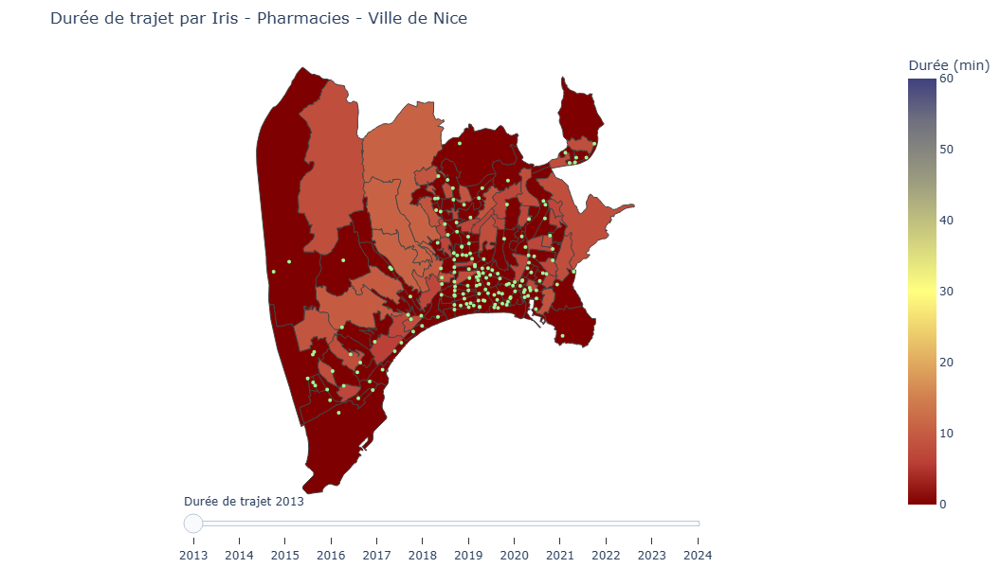

In [24]:
show_label=True
fig = go.Figure()
l=[]
l2=[]
center_lat = gdf.geometry.centroid.y.mean()
center_lon = gdf.geometry.centroid.x.mean()
passage_dico = {"urgence_gen": "passage", "urgence_ped": "passage", "psy": "lit", "pharma": "passage"}
size_dico = {"urgence_gen": 8/30000, "urgence_ped": 8/30000, "psy": 6/100, "pharma": 1}
for year in years:
    gdf_year=gdf_merged[gdf_merged["year"]==year+2000]
    l.append(
        go.Choropleth(
            visible=False,
            geojson=geojson,
            locations=gdf_year["fid"],
            z=gdf_year["time_hc"].fillna(60),
            zmin=0,
            zmax=qmax,
            text=gdf_year.apply(
                lambda row: f"""
Commune: {row["nom_commune"]}<br>
Iris: {row["code_iris"]}<br>
Nom Iris: {row['nom_iris']}<br>
Etablissement le plus proche: {"Aucun" if row["rs"] is None else row["rs"].capitalize()} <br>
Temps d'accès: {">60" if np.isnan(row["time_hc"]) else int(row["time_hc"])} min<br>
Temps d'accès heure pleine: {">60" if np.isnan(row["time_hp"]) else int(row["time_hp"])} min<br>
Distance: {"NA" if np.isnan(row["km"]) else int(row["km"])} km<br>
Variation / 2013: {"NA" if np.isnan(row["delta13"]) else int(row["delta13"]*100)}%<br>
Population: {row['pop']:.0f}<br>""",
                axis=1
            ),
            hoverinfo="text",
            showscale=True,
            colorbar={"title": f"Durée (min)"},
            colorscale=[[0.0, "rgb(127,0,0)"],
                        [q10/qmax if norm_colorbar else 0.1, "rgb(187,64,55)"],
                        [q25/qmax if norm_colorbar else 0.25, "rgb(209,127,79)"],
                        [q50/qmax if norm_colorbar else 0.5, "rgb(255,255,127)"],
                        [q75/qmax if norm_colorbar else 0.75, "rgb(159,159,127)"],
                        [q90/qmax if norm_colorbar else 0.9, "rgb(112,112,127)"],
                        [1.0, "rgb(64,64,127)"]
                       ]
        ))
    if show_label:
        etab_year=etab[etab["year"]==year+2000]
        l2.append(
            go.Scattergeo(
                lon=etab_year["lon"],
                lat=etab_year["lat"],
                text=etab_year.apply(lambda row: f"""
{row["rs"]}<br>
N° Finess: {row["fi"]}<br>
Nb {passage_dico[bor]} 20{year}: {"NA" if row["passu"] is None else int(row["passu"])}<br>
ETP: {"NA" if not(row["has_pdata"]) else np.round(row["etp"],1)}<br>
Dont salarié: {"NA" if not(row["has_pdata"]) else np.round(row["etpsal"],1)}<br>
Dont libéraux: {"NA" if not(row["has_pdata"]) else np.round(row["efflib"],1)}<br>
Tension: {"NA" if not(row["has_pdata"]) or row["tension"]==np.inf else int(row["tension"])} {passage_dico[bor]}/ETP<br>
GPS: {row["lat"]},{row["lon"]}<br>
Color: rgb({127 if not(row["has_pdata"]) or row["tension"]==np.inf else np.clip(int((row['tension']-3000)*0.1+127.5),0,255)},{255 - (127 if not(row["has_pdata"]) or row["tension"]==np.inf else np.clip(int((row['tension']-3000)*0.1+127.5),0,255))},0)
""", axis=1),
                hoverinfo="text",
                showlegend=False,
                visible=False,
                marker=dict(
                        color=etab_year.apply(lambda row: 
# urgence
# f"rgb({127 if not(row["has_pdata"]) or row["tension"]==np.inf else np.clip(int((row['tension']-3000)*0.1+127.5),0,255)},{255 - (127 if not(row["has_pdata"]) or row["tension"]==np.inf else np.clip(int((row['tension']-3000)*0.1+127.5),0,255))},0)"
# psy
f"rgb({127 if not(row["has_pdata"]) or row["tension"]==np.inf else np.clip(int((row['tension']-11)*10+127.5),0,255)},{255 - (127 if not(row["has_pdata"]) or row["tension"]==np.inf else np.clip(int((row['tension']-3000)*0.1+127.5),0,255))},0)"                                              
                            , axis=1),
                        size=(etab_year["passu"].fillna(0))*size_dico[bor]+2,
                        opacity=1,
                        line=dict(
                            color='#99ff99',
                            width=2
                        ),
                    ),
            ))
fig = go.Figure(data=l+l2)
i_visible = 0
fig.data[i_visible].visible = True
if show_label:
    fig.data[len(l)+i_visible].visible = True
steps = []
i=0
for year in years:
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
             ],
        label=f"20{year}",
    )
    step["args"][0]["visible"][i] = True
    if show_label:
        step["args"][0]["visible"][i+len(l)] = True
    steps.append(step)
    i+=1

sliders = [dict(
    active=0,
    currentvalue={"prefix": "Durée de trajet ", "visible":True},
    steps=steps,
    pad=dict(l=0, r=0, t=0, b=10),
    len=0.6,
    x=0.2,
    y=0.05,
)]

fig.update_layout(
    sliders=sliders,
    geo=dict(
        projection_type="mercator",
        center={"lat": center_lat, "lon": center_lon},
        fitbounds="locations",
        showland=False,
        showcountries=False,
        showocean=False,
        showlakes=False,
        showrivers=False,
        visible=False,
    ),
    title=f"Durée de trajet par Iris - {bor_dico[bor]} - {"Ville de" if len(code_commune) != 3 else "Département"} {commune_nom if len(code_commune) != 3 else code_commune[:-1]}",
    height=600,
    # width=2000,  
    autosize=False,
    margin=dict(l=10, r=0, t=50, b=10),
)

fig.show()

In [17]:
gdf_merged["time_hc"].describe().apply("{0:.0f}".format)

count    1606
mean        3
std         4
min         0
25%         0
50%         0
75%         7
max        11
Name: time_hc, dtype: object

In [18]:
fig.update_layout(
    height=None,
    width=None, 
    autosize=True,
    # margin=dict(l=10, r=0, t=50, b=50)
)
pio.write_html(fig, file=f"out/sae_dist_{bor}_{code_commune.replace("%","")}.html", auto_open=True, include_plotlyjs="cdn", full_html=True, config={"responsive": True})